# Sun Glint Removal:
##       Subdataset : 10m résolution

In [1]:
%matplotlib inline

import sys
import os

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from skimage import exposure, img_as_float, morphology

from osgeo import gdal
import osr
import xml.etree.ElementTree as ET
from my_packages.My_Geoprocess import*

def write_raster2(fname, data, geo_transform, projection, DriverName="GTiff", formatMem=gdal.GDT_UInt16 ):
    """Create a GeoTIFF file with the given data."""
    
    driver = gdal.GetDriverByName(DriverName)
    if driver is None:
        print('DriverFailed')
    
    if len(data.shape)==3:
        rows, cols, NBands = data.shape
    else:
        rows, cols = data.shape
        NBands = 1

    dataset = driver.Create(fname, cols, rows,  NBands, formatMem )
    if driver is None:
        print('DatasetCreation Failed')

    dataset.SetGeoTransform(geo_transform)
    dataset.SetProjection(projection)
    if NBands > 1:
        for b in range(NBands): 
            band = dataset.GetRasterBand(b+1)
            band.WriteArray(data[:,:,b])
    else:
        band = dataset.GetRasterBand(1)
        band.WriteArray(data[:,:])
    dataset = None  # Close the file

# Metadatas extraction, reading and checking

In [2]:
FilePath = 'C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/'
image_filePath = "C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/"
xml_fileName = "MTD_MSIL1C.xml"
gdal.ErrorReset()
ds = gdal.Open( image_filePath + xml_fileName )

if ds is None or gdal.GetLastErrorMsg() != '':
    print('xml failed to load')
    
DataSet_md = ds.GetMetadata()
SubDataSet_md = ds.GetMetadata('SUBDATASETS')
SubDataSet_md


{'SUBDATASET_1_DESC': 'Bands B2, B3, B4, B8 with 10m resolution, UTM 58S',
 'SUBDATASET_1_NAME': 'SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:10m:EPSG_32758',
 'SUBDATASET_2_DESC': 'Bands B5, B6, B7, B8A, B11, B12 with 20m resolution, UTM 58S',
 'SUBDATASET_2_NAME': 'SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:20m:EPSG_32758',
 'SUBDATASET_3_DESC': 'Bands B1, B9, B10 with 60m resolution, UTM 58S',
 'SUBDATASET_3_NAME': 'SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:60m:EPSG_32758',
 'SUBDATASET_4_DESC': 'True color image, UTM 58S',
 'SUBDATASET_4_NAME': 'SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:TCI:EPSG_32758'}

In [3]:
# Try opening the 4 subdatasets
ds = []
for i in range(4):
    gdal.ErrorReset()
    ds.append(gdal.Open(SubDataSet_md['SUBDATASET_%d_NAME' % (i+1)]))
    print(SubDataSet_md['SUBDATASET_%d_NAME' % (i+1)])
    if ds is None or gdal.GetLastErrorMsg() != '':
        print('subdatasets failed to load')
        print(SubDataSet_md['SUBDATASET_%d_NAME' % (i+1)],'failed')
src_ds = ds[0]
print(ds[0].RasterCount)

SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:10m:EPSG_32758
SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:20m:EPSG_32758
SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:60m:EPSG_32758
SENTINEL2_L1C:C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/MTD_MSIL1C.xml:TCI:EPSG_32758
4


# Detector FootPrint

In [4]:
FootprintFilePath = 'D:/Image/processed/S2A_OPER_PRD_MSIL1C_PDMC_20161101T012450_R101_V20161031T230902_20161031T230902.SAFE/Footprint'
FootprintFilePath
GT = src_ds.GetGeoTransform()
proj = src_ds.GetProjection()
rows = src_ds.RasterXSize
cols = src_ds.RasterYSize
FootPrint = []

for File in GetSimpleFiles("B01*.tif",directory=FootprintFilePath):
    print(File)
    FootPrint.append(create_mask_from_vector(FootprintFilePath + File, cols, rows, GT, \
                                             proj, target_value=1, format=gdal.GDT_Byte))
    
for i in range(len(FootPrint)):
    FootPrint[i] = FootPrint[i].GetRasterBand(1).ReadAsArray().astype(bool)

'''
plt.figure(figsize=(40, 20))
for i in range(1,11):
    plt.subplot(4, 3, i)
    plt.title(str(i))
    plt.imshow(FootPrint[i-1])
    
plt.show
'''
FootPrintBoarders = np.full(FootPrint[0].shape[0:2] , False, dtype= bool)
'''
plt.figure(figsize=(20, 20))
'''
for i in range(1,10):
    '''
    plt.subplot(4, 3, i)
    '''
    FootPrintBoarders[np.logical_and(FootPrint[i-1], FootPrint[i])] = True
    '''
    plt.imshow(np.logical_and(FootPrint[i-1], FootPrint[i]))
    plt.axis('off')'''
    


B02_06.shp
B02_07.shp
B02_08.shp
B02_09.shp
B02_10.shp
B02_11.shp
B02_12.shp
B02_13.shp
B02_14.shp
B02_15.shp


In [20]:
FootprintFilePath = 'D:/Image/processed/S2A_OPER_PRD_MSIL1C_PDMC_20161101T012450_R101_V20161031T230902_20161031T230902.SAFE/Footprint'
FootprintFilePath
GT = src_ds.GetGeoTransform()
proj = src_ds.GetProjection()
rows = src_ds.RasterXSize
cols = src_ds.RasterYSize
FootPrint = []

count = 0
for File in GetSimpleFiles("B02*.tif",directory=FootprintFilePath):
    print(File)
    band = gdal.Open(FootprintFilePath+'/'+File)
    FootPrint.append(band.GetRasterBand(1).ReadAsArray().astype(bool))

'''
plt.figure(figsize=(40, 20))
for i in range(1,11):
    plt.subplot(4, 3, i)
    plt.title(str(i))
    plt.imshow(FootPrint[i-1])
    
plt.show
'''
FootPrintBoarders = np.full(FootPrint[0].shape[0:2] , False, dtype= bool)
'''
plt.figure(figsize=(20, 20))
'''
for i in range(1,7):
    '''
    plt.subplot(4, 3, i)
    '''
    FootPrintBoarders[np.logical_and(FootPrint[i-1], FootPrint[i])] = True
    '''
    plt.imshow(np.logical_and(FootPrint[i-1], FootPrint[i]))
    plt.axis('off')'''
    


B02_06.tif
B02_07.tif
B02_08.tif
B02_09.tif
B02_10.tif
B02_11.tif
B02_12.tif


In [16]:
del band

# Bands assignment and visualization

In [6]:
NIR = src_ds.GetRasterBand(4).ReadAsArray()

RGB_img = np.dstack((src_ds.GetRasterBand(1).ReadAsArray(),\
                     src_ds.GetRasterBand(2).ReadAsArray(),\
                     src_ds.GetRasterBand(3).ReadAsArray()))
better_contrast = np.empty(RGB_img.shape, dtype= RGB_img.dtype)

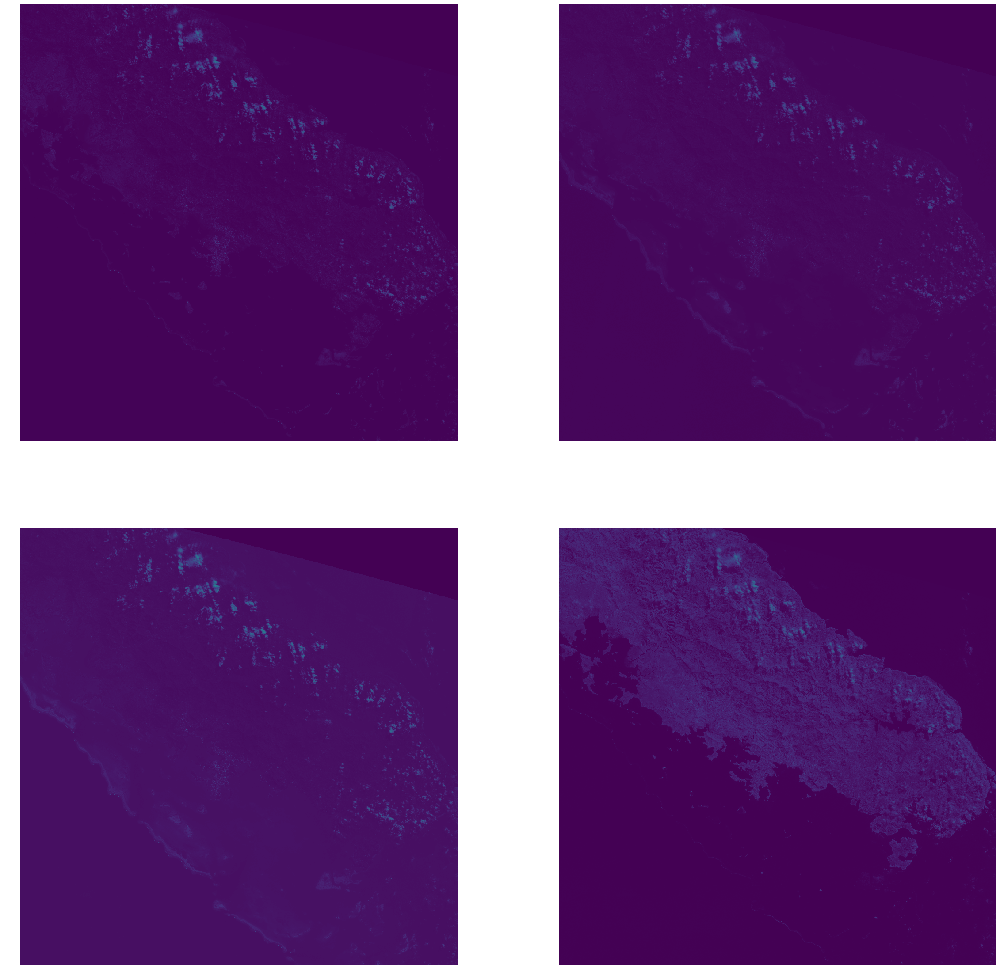

In [7]:
plt.figure(figsize=(40, 40))
for i in range(1,4):
    plt.subplot(2, 2, i)
    plt.imshow(img_as_float(RGB_img[:,:,i-1]))
    plt.axis('off')
#plt.subplot(1, 2, 2)
#plt.imshow(Random)

plt.subplot(2, 2, 4)
plt.imshow(img_as_float(NIR))
plt.axis('off')
plt.show
plt.savefig("figures/ChannelTestNC.png", dpi='figure')

# Display histograms bands

<function matplotlib.pyplot.show>

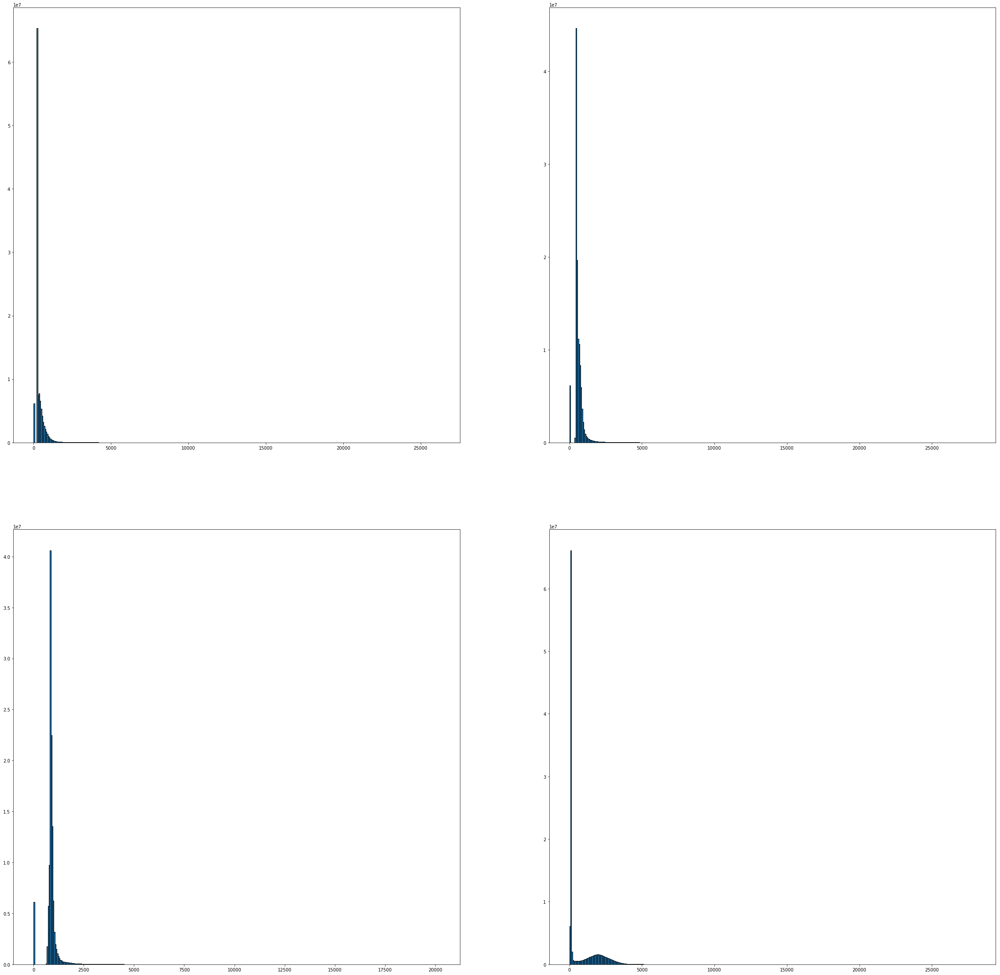

In [8]:
plt.figure(figsize=(40, 40))
for i in range(1,4):  
    plt.subplot(2, 2, i)
    plt.hist(RGB_img[:,:,i-1].ravel(), bins=400, ec='k')

plt.subplot(2, 2, 4)
plt.hist(NIR[:,:].ravel(), bins=400, ec='k')
plt.show

In [9]:
del better_contrast

# Colors setting per tiles of visual

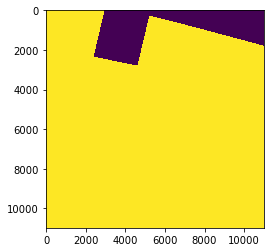

In [10]:
GlobalFootPrint = np.full(FootPrint[0].shape, False , dtype= np.bool_)
for i in range(len(FootPrint)):
    GlobalFootPrint +=  FootPrint[i]
plt.imshow(GlobalFootPrint)

In [11]:
p_min = 5
p_max = 95
for i in range(RGB_img.shape[2]):
    v_min, v_max = np.percentile(RGB_img[:,:,i][GlobalFootPrint], (p_min, p_max))
    print('percentiles ',p_min,', ',p_max,' of band ',str(i),': ',str(v_min),', ',str(v_max),'\n')
    better_contrast[:,:,i] = exposure.rescale_intensity(RGB_img[:,:,i], in_range=(v_min, v_max))


percentiles  5 ,  95  of band  0 :  218.0 ,  926.0 



NameError: name 'better_contrast' is not defined

In [12]:
plt.figure(figsize=(20, 20))
#plt.subplot(1, 2, 1)
plt.imshow(img_as_float(better_contrast))
#plt.subplot(1, 2, 2)
#plt.imshow(Random)
plt.show

NameError: name 'better_contrast' is not defined

In [ ]:
# Display histograms bands
plt.figure(figsize=(40, 40))
for i in range(1,4):
    plt.subplot(2, 2, i)
    plt.hist(better_contrast[:,:,i-1].ravel(), bins=400, ec='k')

plt.subplot(2, 2, 4)
plt.hist(NIR.ravel(), bins=400, ec='k')
plt.show

In [ ]:
plt.figure(figsize=(30, 30))
for i in range(len(FootPrint)):
    plt.subplot(4, 3, i+1)
    plt.hist(NIR[FootPrint[i]].ravel(), bins=400, ec='k', cumulative=True, normed=True)
    plt.title(str(i))



# NIR soil thresholding and mask cleaning per tiles

<function matplotlib.pyplot.show>

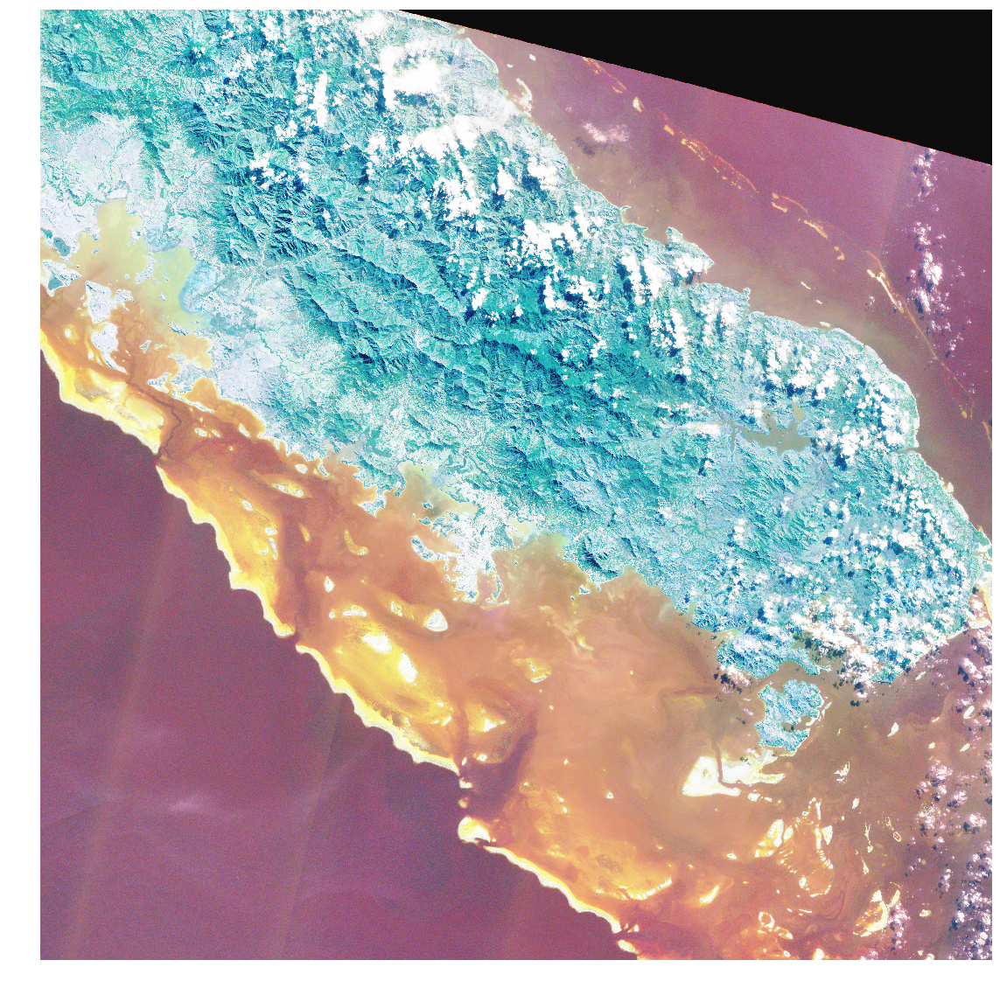

In [13]:
plot_img = np.empty(RGB_img.shape, dtype=float)
for i in range(plot_img.shape[2]):
    plot_img[:,:,i] = exposure.equalize_hist(img_as_float(RGB_img[:,:,2-i]))
    
plt.figure(figsize=(20, 20))
#plt.subplot(1, 2, 1)
plt.imshow(plot_img)
#plt.subplot(1, 2, 2)
#plt.imshow(Random)
plt.axis('off')
plt.show


In [19]:
p_NIR = [10,60,60,80,70,75,90,68,55,35]
Buffer = np.full(RGB_img.shape, 0 , dtype= RGB_img.dtype)
SoilIndex = np.full(RGB_img.shape[0:2] , False, dtype= bool)

for i in range(len(FootPrint)):
    v_NIR = np.percentile(NIR[FootPrint[i]].ravel(), (p_NIR[i]))
    print('percentiles ',p_NIR[i],', of FootPrint ',str(i),': ',str(v_NIR),'\n')
    SoilIndex[np.logical_and(FootPrint[i], NIR>v_NIR)] = True
    
SoilIndex = morphology.remove_small_holes(SoilIndex, 100000)
SoilIndex = np.logical_not(morphology.remove_small_holes(~SoilIndex, 100))
SoilIndex = np.tile(SoilIndex[:,:,np.newaxis], (1,1,3))
Buffer[SoilIndex] = RGB_img[SoilIndex]
    
write_raster2(FilePath+'/Mask2/'+'10m.tif', SoilIndex[:,:,0], ds[0].GetGeoTransform(), ds[0].GetProjection(), DriverName="GTiff", formatMem=gdal.GDT_Byte)
Mask = []
Mask.append(gdal.Open( FilePath+'/Mask2/'+'10m.tif'))
res = [10, 20, 60]
for i in range(1,3):
    # Output / destination
    MaskPath = FilePath+'/Mask2/'+str(res[i])+'m.tif'
    Mask.append(gdal.GetDriverByName('GTiff').Create(MaskPath, ds[i].RasterXSize, ds[i].RasterYSize, 1, gdal.GDT_Byte))
    Mask[i].SetGeoTransform( ds[i].GetGeoTransform())
    Mask[i].SetProjection( ds[i].GetProjection())
    gdal.ReprojectImage(Mask[0], Mask[i], None, None, eResampleAlg=8 )
Mask = None



percentiles  10 , of FootPrint  0 :  1305.0 

percentiles  60 , of FootPrint  1 :  853.0 

percentiles  60 , of FootPrint  2 :  108.0 

percentiles  80 , of FootPrint  3 :  1159.0 

percentiles  70 , of FootPrint  4 :  549.0 

percentiles  75 , of FootPrint  5 :  635.0 

percentiles  90 , of FootPrint  6 :  286.0 

percentiles  68 , of FootPrint  7 :  630.0 

percentiles  55 , of FootPrint  8 :  496.0 

percentiles  35 , of FootPrint  9 :  727.0 



In [ ]:
plt.figure(figsize=(15, 15))
#plt.subplot(1, 2, 1)
plt.imshow(SoilIndex[:,:,0])
#plt.subplot(1, 2, 2)
#plt.imshow(Random)
plt.axis('off')
plt.show

#  Sun Glint removal: Deep Zone definition

In [5]:
RasterWidth = src_ds.RasterXSize
RasterHeight = src_ds.RasterYSize
DeepSample = np.full((RasterHeight, RasterWidth) , False, dtype= bool)
DeepSample = create_mask_from_vector(FilePath+'/Mask/' + 'DeepSamples.shp', RasterWidth, RasterHeight, GT, \
                                             proj, target_value=1, format=gdal.GDT_Byte)
DeepSample = DeepSample.GetRasterBand(1).ReadAsArray()

'''
DeepSample2 = np.full((RasterHeight, RasterWidth) , False, dtype= bool)
srs_ds = osr.SpatialReference()
srs_ds.ImportFromWkt(src_ds.GetProjection())
srsLatLong = srs_ds.CloneGeogCS()
ctInv = osr.CoordinateTransformation(srsLatLong, srs_ds)

GT_ds = src_ds.GetGeoTransform()
Inv_geometrix = gdal.InvGeoTransform(GT_ds)

Pix = np.array([[8500, 0],[10000, 400]])
Pix = np.vstack((Pix, np.array([[8500, 1000],[10000, 2200]])))
#Pix = np.vstack((Pix,np.array([[9000, 3500],[10000, 4700]])))
Pix = np.vstack((Pix,np.array([[9980, 3500],[RasterHeight, 4700]])))
Pix = np.vstack((Pix,np.array([[10450, 5600],[RasterHeight, 6400]])))
Pix = np.vstack((Pix,np.array([[0, 10500],[600, RasterWidth]])))
Pix = np.vstack((Pix,np.array([[10730, 10530],[RasterHeight, RasterWidth]])))

CoordDW = GetLonLat(Pix, src_ds)[:,0:2]
px, py = GetPixel(ctInv, Inv_geometrix, CoordDW)

DeepSample[8500:10000,0:400] = True
DeepSample[8500:10000,1000:2200] = True
#DeepSample[9000:10000,3500:4700] = True
DeepSample[9980:,3500:4700] = True
DeepSample[10450:,5600:6400] = True
DeepSample[0:600,10500:] = True
DeepSample[10730:,10530:] = True

from skimage.morphology import binary_dilation, diamond
DeepSample2 = np.full((RasterWidth, RasterHeight) , False, dtype= bool)
'''


'\nDeepSample2 = np.full((RasterHeight, RasterWidth) , False, dtype= bool)\nsrs_ds = osr.SpatialReference()\nsrs_ds.ImportFromWkt(src_ds.GetProjection())\nsrsLatLong = srs_ds.CloneGeogCS()\nctInv = osr.CoordinateTransformation(srsLatLong, srs_ds)\n\nGT_ds = src_ds.GetGeoTransform()\nInv_geometrix = gdal.InvGeoTransform(GT_ds)\n\nPix = np.array([[8500, 0],[10000, 400]])\nPix = np.vstack((Pix, np.array([[8500, 1000],[10000, 2200]])))\n#Pix = np.vstack((Pix,np.array([[9000, 3500],[10000, 4700]])))\nPix = np.vstack((Pix,np.array([[9980, 3500],[RasterHeight, 4700]])))\nPix = np.vstack((Pix,np.array([[10450, 5600],[RasterHeight, 6400]])))\nPix = np.vstack((Pix,np.array([[0, 10500],[600, RasterWidth]])))\nPix = np.vstack((Pix,np.array([[10730, 10530],[RasterHeight, RasterWidth]])))\n\nCoordDW = GetLonLat(Pix, src_ds)[:,0:2]\npx, py = GetPixel(ctInv, Inv_geometrix, CoordDW)\n\nDeepSample[8500:10000,0:400] = True\nDeepSample[8500:10000,1000:2200] = True\n#DeepSample[9000:10000,3500:4700] = True

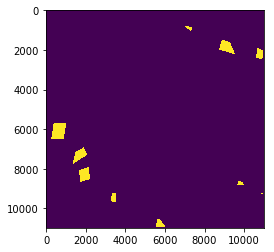

In [16]:
plt.imshow(DeepSample)

In [22]:

'''
for i in range(len(px-1)):
    print('{0: d} / x: {1: =d},  y: {2: =d}'.format(i,int(round(px[i])), int(round(py[i]))))
for i in range(0, len(px)-1, 2):
    print(i)
    DeepSample2[int(round(px[i])):int(round(px[i+1])),int(round(py[i])):int(round(py[i+1]))] = True
'''

'''write_raster2(FilePath+'/Mask/'+'DeepSamples.tif', DeepSample, ds[0].GetGeoTransform(), ds[0].GetProjection(), DriverName="GTiff", formatMem=gdal.GDT_Byte)'''
'''print(np.sum(np.logical_not(DeepSample2==DeepSample)))'''

write_raster2(FootprintFilePath+'/Boerders.tif', FootPrintBoarders, ds[0].GetGeoTransform(), ds[0].GetProjection(), DriverName="GTiff", formatMem=gdal.GDT_Byte)


# Sun Glint removal: 10m resolution Subdataset: R, G, B bands

In [17]:
SumPix = RGB_img.shape[0]*RGB_img.shape[1]

# Special process for tile 5, index 4
SelecMask = [np.full(FootPrint[0].shape, True, bool) for i in range(len(FootPrint))]
SelecMask[4][0:5000,:] = False

# Samples Structure: list [FootPrint][Bands (R->g->b)]
# NIRSamples Structure: list [FootPrint]
# MinNIR Structure: list [FootPrint] =  [min, argmin(overs elction indexation !)]   --- just min
Samples = [[RGB_img[np.logical_and(FootPrint[f], DeepSample),c] for c in range(RGB_img.shape[2])] for f in range(len(FootPrint))]
NIRSamples = [NIR[np.logical_and(FootPrint[f], DeepSample)] for f in range(len(FootPrint))]
MinNir = [min(NIRSamples[f], default= np.NaN) for f in range(len(FootPrint))]


Inventory = [np.sum(np.logical_and(FootPrint[i], DeepSample)) for i in range(len(FootPrint))]
print('Number of pixel per samples: ',Inventory)
print('Minimum N-Infrared value per sample',MinNir)

Number of pixel per samples:  [0, 505981, 603834, 100805, 125600, 45277, 5623, 155295, 334087, 48943]
Minimum N-Infrared value per sample [nan, 71, 71, 75, 72, 73, 88, 82, 87, 91]


In [19]:
NBands = RGB_img.shape[2]


coeff = Get_LinReg(Samples, NIRSamples, NBands) # get correction coefficients
R2 = Get_R2(coeff, Samples, NIRSamples, NBands)   # get regressions scores

In [ ]:
help(Get_R2)

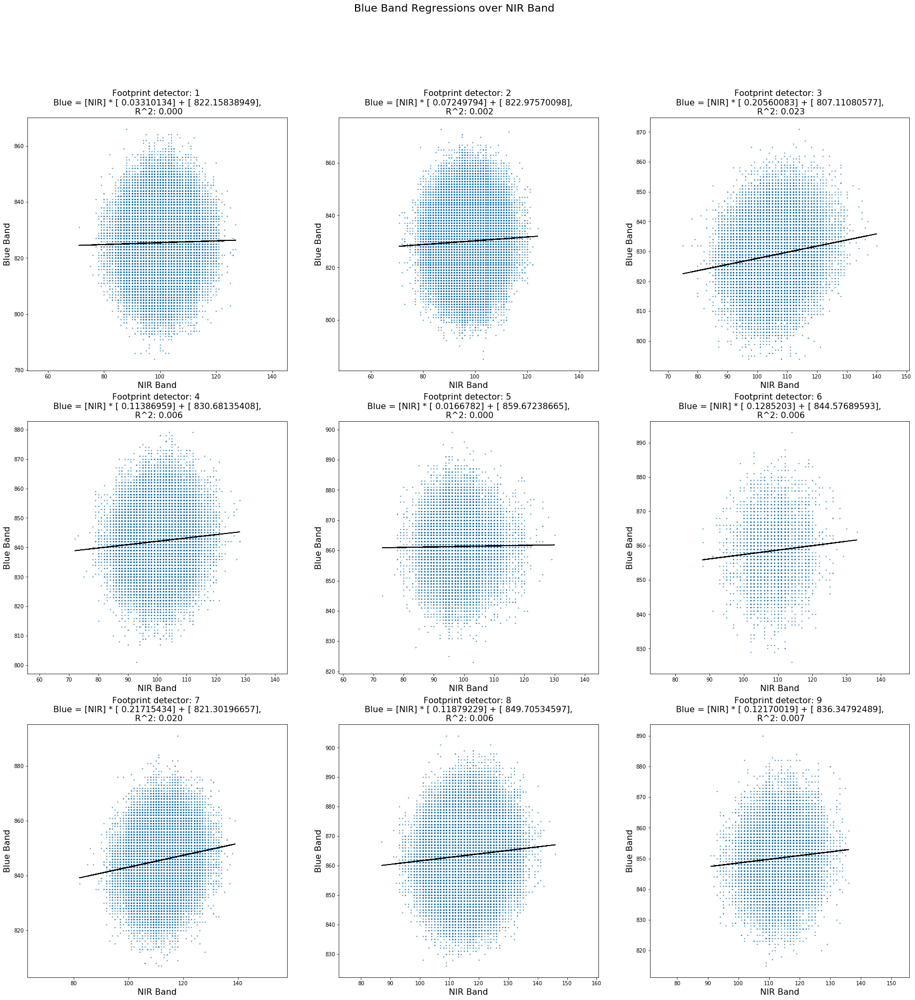

In [27]:
BandTitle = ['Red', 'Green', 'Blue']
save = True
c = 2
plt.figure(figsize=(30, 30))
count = 1
for f in range(len(NIRSamples)):
    N = len(NIRSamples[f])
    # Results for Blue bands
    if N > 0:
        plt.subplot(3, 3, count)
        count = count + 1
        plt.scatter(NIRSamples[f], Samples[f][c],s=1)
        plt.plot(NIRSamples[f], np.hstack((NIRSamples[f].reshape(N,1), np.ones((N,1)))).dot(coeff[f][c]), c='k')
        plt.axis('equal')
        plt.title('Footprint detector: {0:d} \n {1:s} = [NIR] * {2:} + {3:}, \n R^2: {4:.3f}'\
                  .format(f, BandTitle[c], coeff[f][c][0], coeff[f][c][1], R2[f][c]), fontsize=16)
        plt.xlabel('NIR Band', fontsize=16)
        plt.ylabel(BandTitle[c]+' Band', fontsize=16)
        
        
plt.suptitle(BandTitle[c]+' Band Regressions over NIR Band', fontsize=20)
plt.show
if save:
    plt.savefig(FilePath+"figures/"+BandTitle[c]+"DeglintProcess2.png", dpi='figure', bbox_inches='tight', pad_inches=0.0)

In [28]:
MeanR2_perFp = [np.mean(R2[f][:]) for f in range(len(NIRSamples))]
MeanR2_perCo = [np.mean([R2[f][c] for f in range(len(NIRSamples)) if R2[f][:]]) for c in range(NBands)]
print('Average dertermination coefficient per footprint:', MeanR2_perFp)
print('Average dertermination coefficient per color:', MeanR2_perCo)

Average dertermination coefficient per footprint: [nan, 0.00044722738331737233, 0.0010627899248574952, 0.027544383200215461, 0.0057416176475492504, 0.025167478690555984, 0.0067552327250189519, 0.023686166663428859, 0.011326228869905567, 0.0077979372095750383]
Average dertermination coefficient per color: [0.015189401815760253, 0.013506113498748319, 0.0078141721236327545]


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [29]:
deglingt_img = np.empty(RGB_img.shape, dtype= RGB_img.dtype)
index = np.full(RGB_img.shape , False, dtype= bool)
buffer = float() 
for c in range(RGB_img.shape[2]):
    for f in range(len(FootPrint)):
        if len(NIRSamples[f]) > 0:
            index[:,:,c] = np.logical_and(FootPrint[f], ~SoilIndex[:,:,c])
            buffer = RGB_img[index] - coeff[f][c][0]*(NIR[index[:,:,c]] - np.nanmin(MinNir))
            print(len(buffer[buffer<0]))
            buffer[buffer<0] = 0
            deglingt_img[index] = buffer
            index = np.full(RGB_img.shape , False, dtype= bool)
deglingt_img[SoilIndex] = RGB_img[SoilIndex]

# Degling Image
#plt.figure(figsize=(20, 20))
#plt.imshow(img_as_float(deglingt_img))
#plt.axis('off')
#plt.show
''' 257
17675
17850
47974
94006
1
330
8095
11517
63160
118503
0
221
1774
1701
18829
33485
0 '''

0
3904
10
0
0
0
3560
11220
7863
0
2329
0
0
0
0
2122
5775
5276
0
16
0
0
0
0
3
37
1177


' 257\n17675\n17850\n47974\n94006\n1\n330\n8095\n11517\n63160\n118503\n0\n221\n1774\n1701\n18829\n33485\n0 '

percentiles  6 ,  94  of band  0 :  216.0 ,  905.0 

percentiles  6 ,  94  of band  1 :  434.0 ,  1012.0 

percentiles  6 ,  94  of band  2 :  753.0 ,  1186.0 



<function matplotlib.pyplot.show>

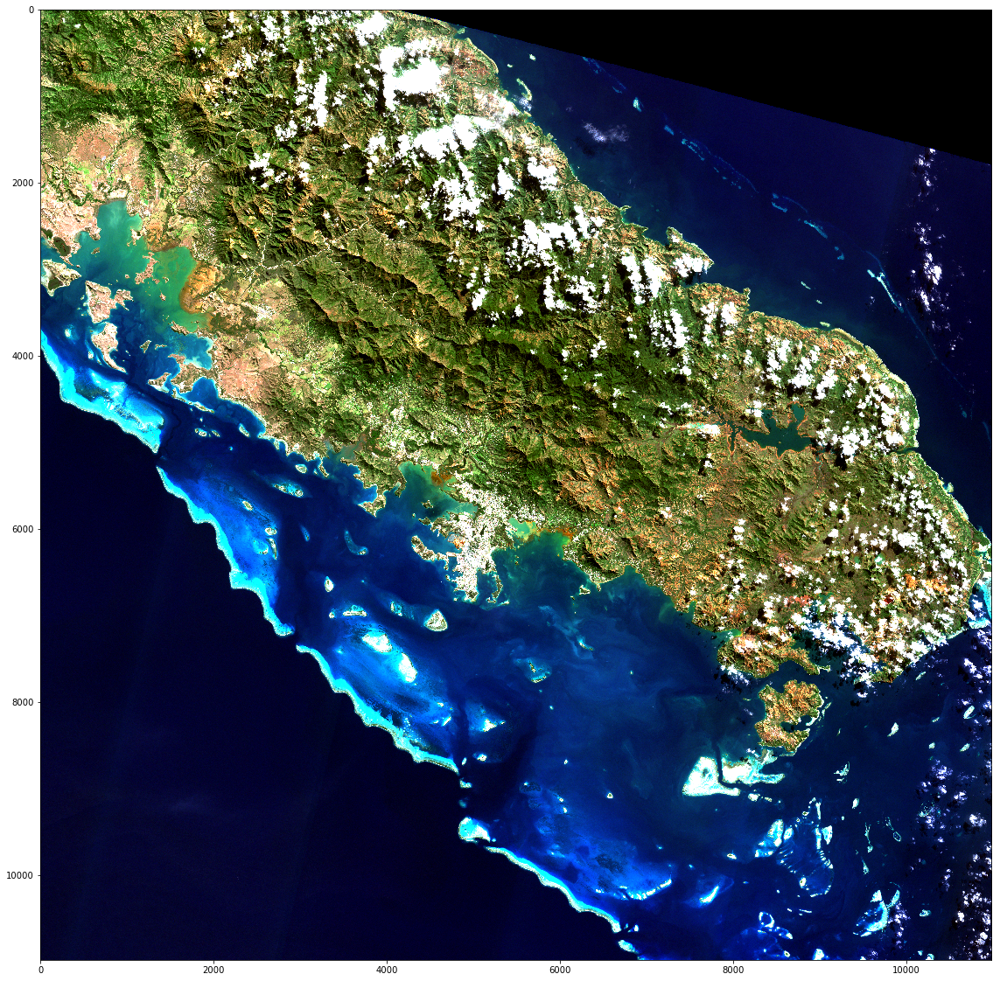

In [33]:
better_contrast = np.empty(deglingt_img.shape, dtype= RGB_img.dtype)
p_min = 6
p_max = 94
for i in range(deglingt_img.shape[2]):
    v_min, v_max = np.percentile(deglingt_img[:,:,i][GlobalFootPrint], (p_min, p_max))
    print('percentiles ',p_min,', ',p_max,' of band ',str(i),': ',str(v_min),', ',str(v_max),'\n')
    better_contrast[:,:,i] = exposure.rescale_intensity(deglingt_img[:,:,i], in_range=(v_min, v_max))
    
# Degling Image
plt.figure(figsize=(20, 20))
plt.imshow(img_as_float(better_contrast))
plt.axis('on')
plt.show

In [45]:
GT = ds[0].GetGeoTransform()
proj = ds[0].GetProjection()

tilespath = 'C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_MSIL1C_20170718T231141_N0205_R101_T58KFA_20170718T231219.SAFE/GRANULE/L1C_T58KFA_A010823_20170718T231219/IMG_DATA/'
write_raster2(tilespath+'Deglinted/'+'Compo.tif', deglingt_img, GT, proj, DriverName="GTiff")


In [46]:
del RGB_img, deglingt_img, NIR , NIRSamples, Samples, better_contrast

In [ ]:
print(ds[1].GetGeoTransform())
print(dst.GetGeoTransform())

In [47]:
del NIR, NIRSamples, Samples, deglingt_img

NameError: name 'NIR' is not defined

# Detector Footprint (2)

<function matplotlib.pyplot.show>

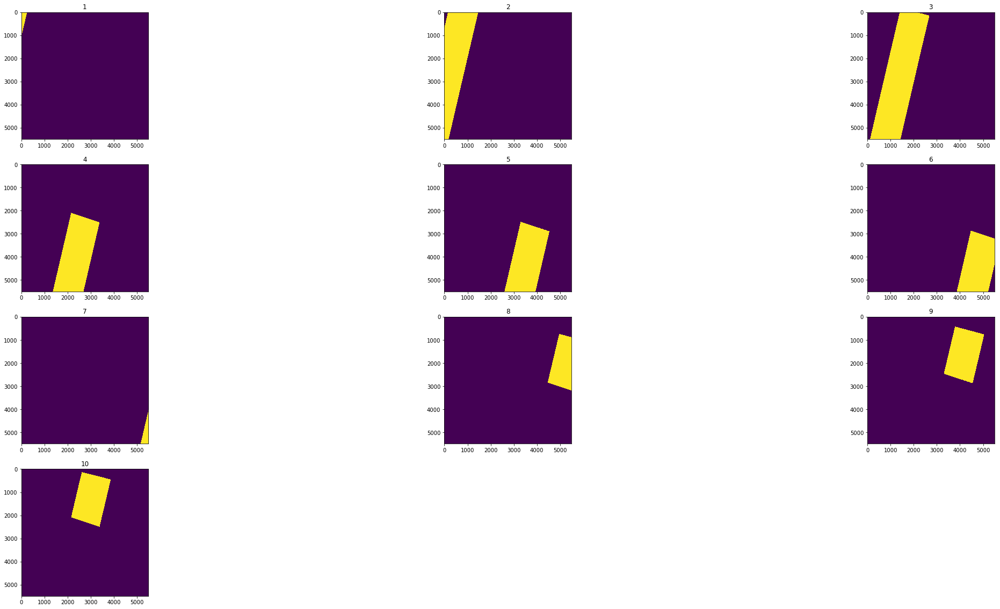

In [49]:
# FootprintFilePath = 'C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_OPER_PRD_MSIL1C_PDMC_20161101T012450_R101_V20161031T230902_20161031T230902.SAFE/Footprint/'

FootPrint = []

GT = ds[1].GetGeoTransform()
proj = ds[1].GetProjection()
rows = ds[1].RasterXSize
cols = ds[1].RasterYSize
FootPrint = []

for File in GetSimpleFiles("B02*.shp",directory=FootprintFilePath):
    FootPrint.append(create_mask_from_vector(FootprintFilePath + File, cols, rows, GT, \
                                             proj, target_value=1, format=gdal.GDT_Byte))
    
for i in range(len(FootPrint)):
    FootPrint[i] = FootPrint[i].GetRasterBand(1).ReadAsArray().astype(bool)
    
plt.figure(figsize=(40, 20))
for i in range(1,11):
    plt.subplot(4, 3, i)
    plt.title(str(i))
    plt.imshow(FootPrint[i-1])
    
plt.show

    


In [50]:
FootPrint[0].shape

(5490, 5490)

# Band assignement and visualisation (2)

In [51]:
Rsup = ds[1].GetRasterBand(1).ReadAsArray()
Nir8a = ds[1].GetRasterBand(4).ReadAsArray()

In [ ]:
plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.imshow(img_as_float(Rsup))
plt.axis('off')
plt.title('Additionnal Red Band')
#plt.subplot(1, 2, 2)
#plt.imshow(Random)

plt.subplot(1, 2, 2)
plt.imshow(img_as_float(Nir8a))
plt.axis('off')
plt.title('Additionnal NIR Band')
plt.show
#plt.savefig("figures/ChannelTestNC.png", dpi='figure')

#  Sun Glint removal: Deep Zone definition (2)

In [53]:
RasterWidth = ds[1].RasterXSize
RasterHeight = ds[1].RasterYSize
DeepSample = np.full((RasterHeight, RasterWidth) , False, dtype= bool)
DeepSample = create_mask_from_vector(FilePath+'/Mask/' + 'DeepSamples.shp', RasterWidth, RasterHeight, GT, \
                                             proj, target_value=1, format=gdal.GDT_Byte)
DeepSample = DeepSample.GetRasterBand(1).ReadAsArray()

In [52]:
Rsup.shape

(5490, 5490)

# Sun Glint removal: 20m resolution Subdataset: Rsup bands

In [54]:
SumPix = Rsup.shape[0]*Rsup.shape[1]

# Samples Structure: list [FootPrint][Bands (R->g->b)]
# NIRSamples Structure: list [FootPrint]
# MinNIR Structure: list [FootPrint] =  [min, argmin(overs elction indexation !)]   --- just min
Samples = [Rsup[np.logical_and(FootPrint[f], DeepSample)] for f in range(len(FootPrint))]
NIRSamples = [Nir8a[np.logical_and(FootPrint[f], DeepSample)] for f in range(len(FootPrint))]
MinNir = [min(NIRSamples[f], default= np.NaN) for f in range(len(FootPrint))]

Inventory = [np.sum(np.logical_and(FootPrint[i], DeepSample)) for i in range(len(FootPrint))]
print('Number of pixel per samples: ',Inventory)
print('Minimum N-Infrared value per sample',MinNir)
NBands = 1

Number of pixel per samples:  [0, 126494, 150958, 25205, 31393, 11328, 1405, 38825, 83503, 12229]
Minimum N-Infrared value per sample [nan, 60, 55, 67, 55, 61, 73, 72, 71, 77]


In [55]:
coeff = Get_LinReg(Samples, NIRSamples, NBands) # get correction coefficients
len(coeff[2])


2

In [56]:
R2 = Get_R2(coeff, Samples, NIRSamples, NBands)
R2

[[],
 0.00034699674542248982,
 0.00040587698637428726,
 0.022911074838615098,
 0.0027695987587290638,
 0.021384960425162802,
 9.4773852865936981e-05,
 0.016234408960449698,
 0.0095292815422427513,
 0.0068572745263233426]

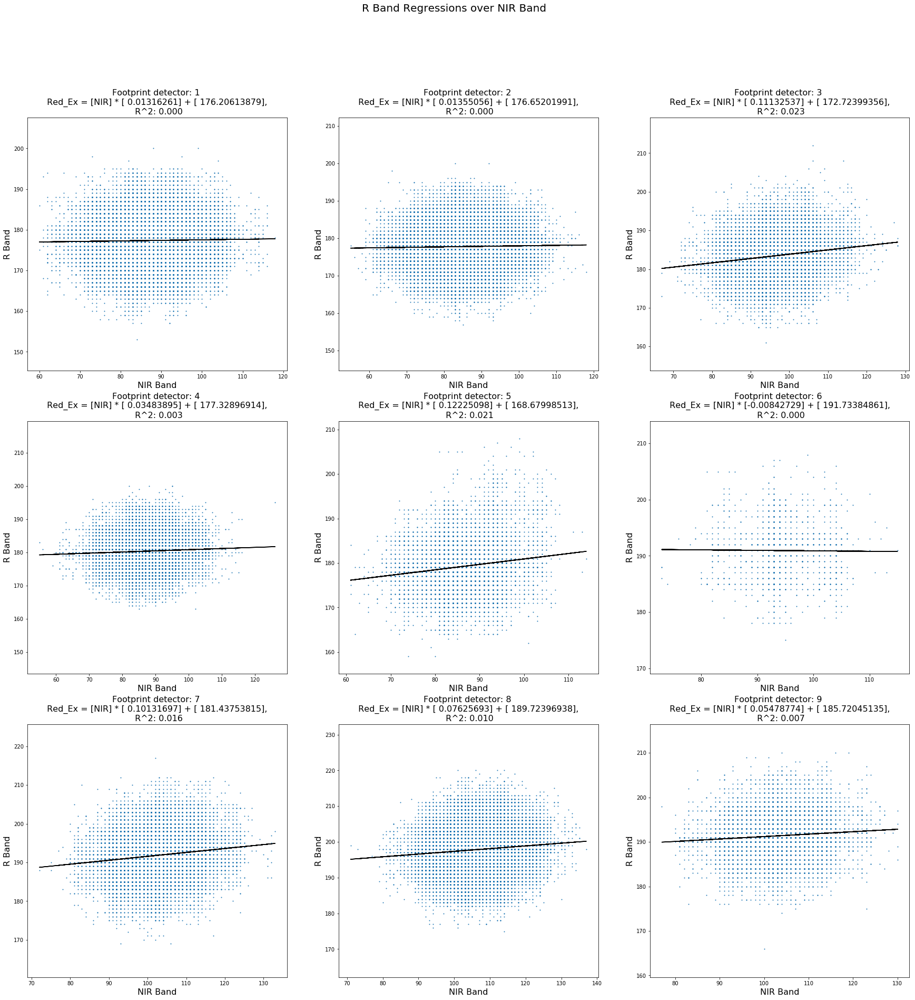

In [58]:
BandTitle = 'Red_Ex'
save = True
c = 0

plt.figure(figsize=(30, 30))
count = 1
for f in range(len(NIRSamples)):
    N = len(NIRSamples[f])
    # Results for Blue bands
    if N > 0:
        plt.subplot(3, 3, count)
        count = count + 1
        plt.scatter(NIRSamples[f], Samples[f],s=1)
        plt.plot(NIRSamples[f], np.hstack((NIRSamples[f].reshape(N,1), np.ones((N,1)))).dot(coeff[f]), c='k')
        plt.axis('equal')
        plt.title('Footprint detector: {0:d} \n {1:s} = [NIR] * {2:} + {3:}, \n R^2: {4:.3f}'\
                  .format(f, BandTitle, coeff[f][0], coeff[f][1], R2[f]), fontsize=16)
        plt.xlabel('NIR Band', fontsize=16)
        plt.ylabel(BandTitle[c]+' Band', fontsize=16)

plt.suptitle(BandTitle[c]+' Band Regressions over NIR Band', fontsize=20)
plt.show
if save:
    plt.savefig(FilePath+"figures/"+BandTitle[c]+"DeglintProcess2.png", dpi='figure', bbox_inches='tight', pad_inches=0.0)

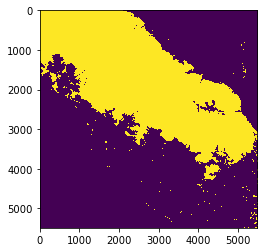

In [59]:
SoilMask = gdal.Open( FilePath+'/Mask/'+'20m.tif')
SoilIndex = SoilMask.GetRasterBand(1).ReadAsArray().astype(np.bool_)
plt.imshow(SoilIndex)
del SoilMask

In [60]:

save =0
if save:
    plt.savefig("figures/"+BandTitle[c]+"DeglintProcess20m.png", dpi='figure', bbox_inches='tight', pad_inches=0.0)

deglingt_img = np.empty(Rsup.shape, dtype= Rsup.dtype)
index = np.full(Rsup.shape , False, dtype= bool)
buffer = float() 
for f in range(len(FootPrint)):
    if len(NIRSamples[f]) > 0:
        index[:,:] = np.logical_and(FootPrint[f], ~SoilIndex[:,:])
        buffer = Rsup[index] - coeff[f][0]*(Nir8a[index[:,:]] - np.nanmin(MinNir))
        print(np.sum(buffer<0))
        buffer[buffer<0] = 0            
        deglingt_img[index] = buffer
deglingt_img[SoilIndex] = Rsup[SoilIndex]
 
'''47
2859
2774
6743
7460
0'''

0
0
0
0
0
0
0
0
0


'47\n2859\n2774\n6743\n7460\n0'

<function matplotlib.pyplot.show>

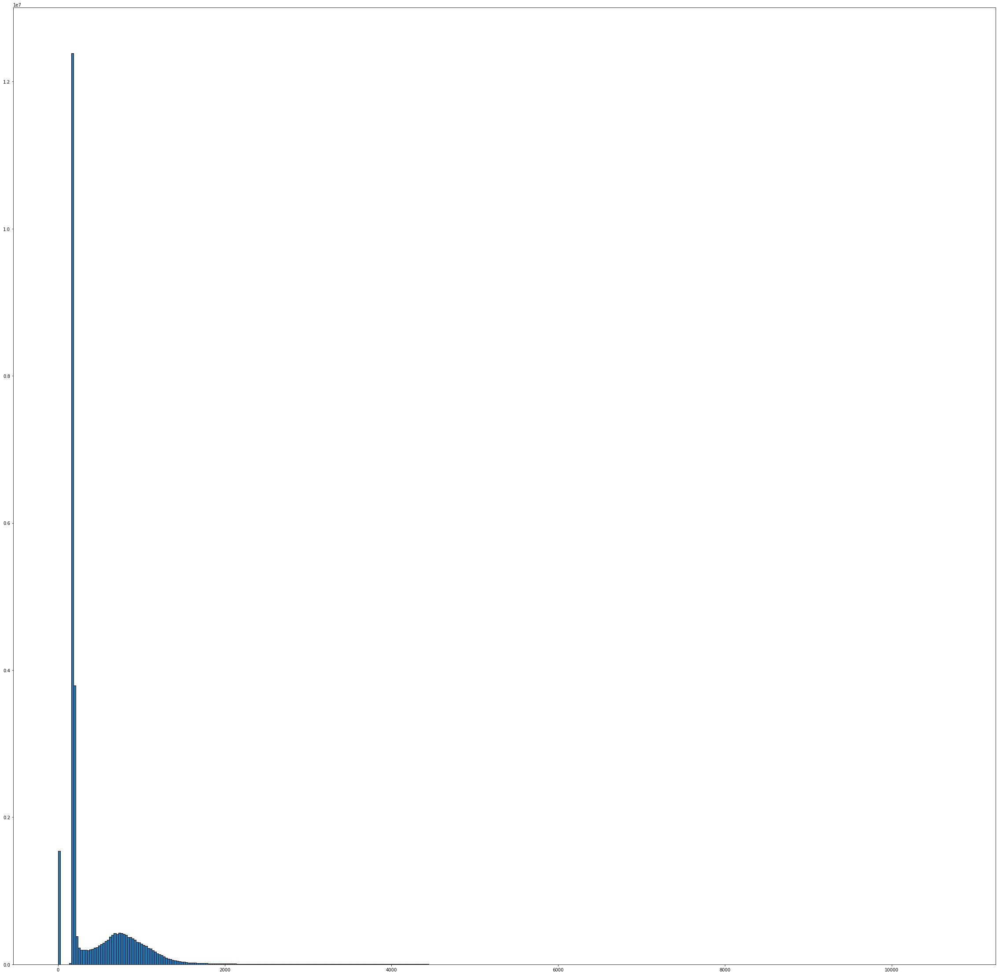

In [61]:
100*np.sum(deglingt_img==0)/len(deglingt_img.flatten())

plt.figure(figsize=(40, 40))
plt.hist(deglingt_img[:,:].ravel(), bins=400, ec='k')
plt.show

In [ ]:
better_contrast = np.empty(deglingt_img.shape, dtype= deglingt_img.dtype)
p_min = 6
p_max = 94

v_min, v_max = np.percentile(deglingt_img[:,:], (p_min, p_max))
print('percentiles ',p_min,', ',p_max,' of band ',str(i),': ',str(v_min),', ',str(v_max),'\n')
better_contrast[:,:] = exposure.rescale_intensity(deglingt_img[:,:], in_range=(v_min, v_max))
    
# Degling Image
plt.figure(figsize=(20, 20))
plt.imshow(img_as_float(better_contrast))
plt.axis('on')
plt.show

In [62]:
GT = ds[1].GetGeoTransform()
proj = ds[1].GetProjection()


write_raster2(tilespath+'Deglinted/'+'Red_Ex.tif', deglingt_img, GT, proj, DriverName="GTiff")

In [67]:
del NIRSamples, Samples, better_contrast, Rsup, Nir8a, Buffer

In [ ]:
del Buffer

# Detector Footprint (2)

<function matplotlib.pyplot.show>

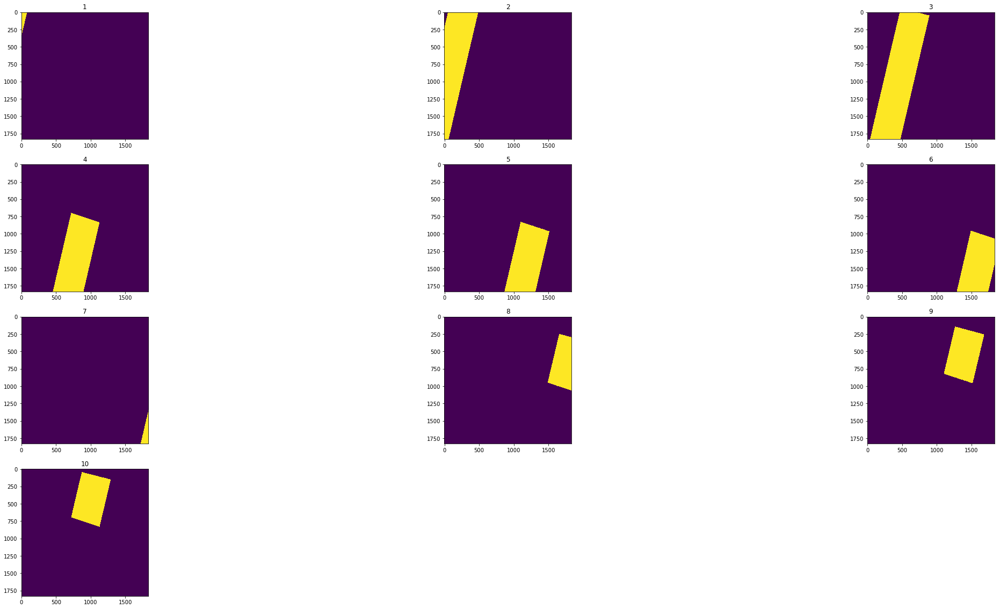

In [68]:
# FootprintFilePath = 'C:/Users/samrari/ComputBuffer/Image/Sen2/S2A_OPER_PRD_MSIL1C_PDMC_20161101T012450_R101_V20161031T230902_20161031T230902.SAFE/Footprint/'

FootPrint = []

GT = ds[2].GetGeoTransform()
proj = ds[2].GetProjection()
rows = ds[2].RasterXSize
cols = ds[2].RasterYSize
FootPrint = []

for File in GetSimpleFiles("B02*.shp",directory=FootprintFilePath):
    FootPrint.append(create_mask_from_vector(FootprintFilePath + File, cols, rows, GT, \
                                             proj, target_value=1, format=gdal.GDT_Byte))
    
for i in range(len(FootPrint)):
    FootPrint[i] = FootPrint[i].GetRasterBand(1).ReadAsArray().astype(bool)
    
plt.figure(figsize=(40, 20))
for i in range(1,11):
    plt.subplot(4, 3, i)
    plt.title(str(i))
    plt.imshow(FootPrint[i-1])
    
plt.show



In [ ]:
# Band assignement and visualisation (2)

In [ ]:
 ds[2]

In [69]:
Bsup = ds[2].GetRasterBand(1).ReadAsArray()
Nir9 = ds[2].GetRasterBand(2).ReadAsArray()

In [ ]:
plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.imshow(img_as_float(Bsup))
plt.axis('off')
plt.title('Additionnal Red Band')
#plt.subplot(1, 2, 2)
#plt.imshow(Random)

plt.subplot(1, 2, 2)
plt.imshow(img_as_float(Nir9))
plt.axis('off')
plt.title('Additionnal NIR Band')
plt.show
#plt.savefig("figures/ChannelTestNC.png", dpi='figure')

#  Sun Glint removal: Deep Zone definition (2)

In [72]:
RasterWidth = ds[2].RasterXSize
RasterHeight = ds[2].RasterYSize
DeepSample = np.full((RasterHeight, RasterWidth) , False, dtype= bool)
DeepSample = create_mask_from_vector(FilePath+'/Mask/' + 'DeepSamples.shp', RasterWidth, RasterHeight, GT, \
                                             proj, target_value=1, format=gdal.GDT_Byte)
DeepSample = DeepSample.GetRasterBand(1).ReadAsArray()
DeepSample.shape

(1830, 1830)

# Sun Glint removal: 60m resolution Subdataset: Bsup bands

In [71]:
SumPix = Bsup.shape[0]*Bsup.shape[1]

# Samples Structure: list [FootPrint][Bands (R->g->b)]
# NIRSamples Structure: list [FootPrint]
# MinNIR Structure: list [FootPrint] =  [min, argmin(overs elction indexation !)]   --- just min
Samples = [Bsup[np.logical_and(FootPrint[f], DeepSample)] for f in range(len(FootPrint))]
NIRSamples = [Nir9[np.logical_and(FootPrint[f], DeepSample)] for f in range(len(FootPrint))]
MinNir = [min(NIRSamples[f], default= np.NaN) for f in range(len(FootPrint))]

Inventory = [np.sum(np.logical_and(FootPrint[i], DeepSample)) for i in range(len(FootPrint))]
print('Number of pixel per samples: ',Inventory)
print('Minimum N-Infrared value per sample',MinNir)
NBands = 1

Number of pixel per samples:  [0, 14055, 16774, 2800, 3489, 1260, 159, 4313, 9267, 1362]
Minimum N-Infrared value per sample [nan, 29, 34, 36, 33, 33, 36, 35, 34, 34]


In [73]:
coeff = Get_LinReg(Samples, NIRSamples, NBands) # get correction coefficients
len(coeff[2])
R2 = Get_R2(coeff, Samples, NIRSamples, NBands)
R2

[[],
 0.0065728649942559114,
 0.0036871188087753692,
 0.0022145798478371281,
 7.2439558208015065e-05,
 0.0088235384827378693,
 0.087766527403467576,
 0.018137187727547022,
 0.010214217184535634,
 0.00223329783580406]

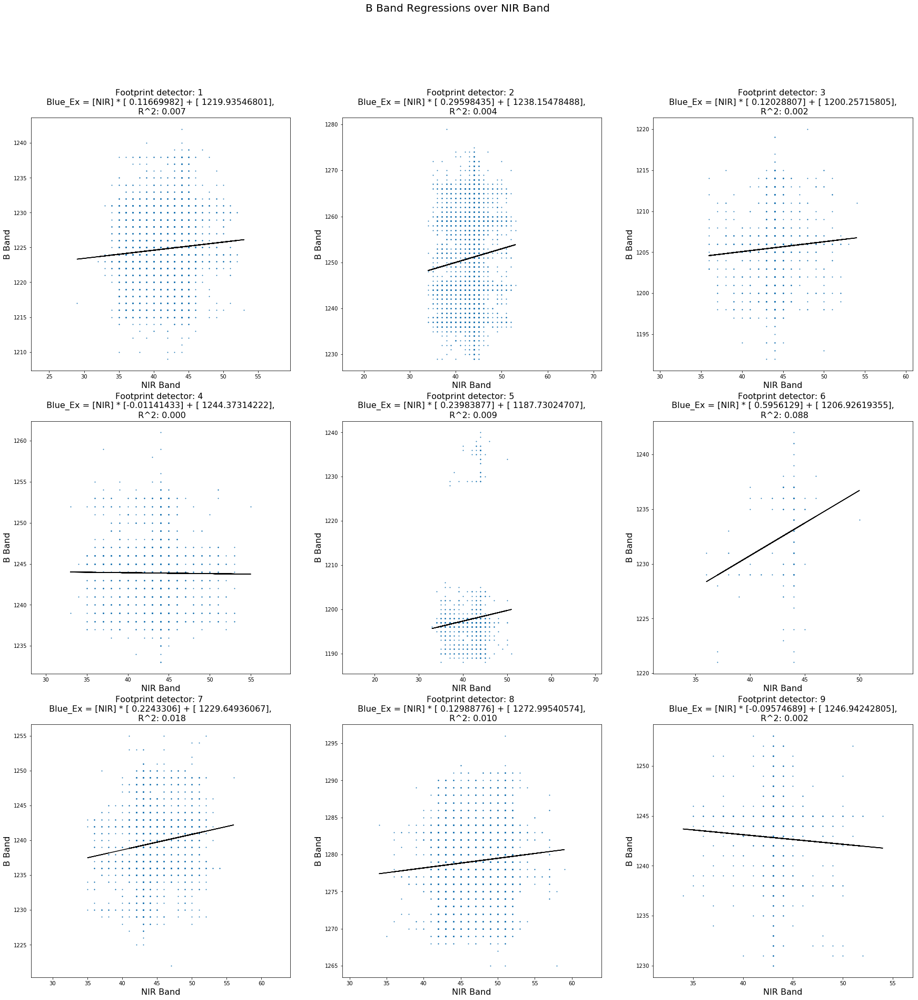

In [75]:
BandTitle = 'Blue_Ex'
save = True
c = 0

plt.figure(figsize=(30, 30))
count = 1
for f in range(len(NIRSamples)):
    N = len(NIRSamples[f])
    # Results for Blue bands
    if N > 0:
        plt.subplot(3, 3, count)
        count = count + 1
        plt.scatter(NIRSamples[f], Samples[f],s=1)
        plt.plot(NIRSamples[f], np.hstack((NIRSamples[f].reshape(N,1), np.ones((N,1)))).dot(coeff[f]), c='k')
        plt.axis('equal')
        plt.title('Footprint detector: {0:d} \n {1:s} = [NIR] * {2:} + {3:}, \n R^2: {4:.3f}'\
                  .format(f, BandTitle, coeff[f][0], coeff[f][1], R2[f]), fontsize=16)
        plt.xlabel('NIR Band', fontsize=16)
        plt.ylabel(BandTitle[c]+' Band', fontsize=16)

plt.suptitle(BandTitle[c]+' Band Regressions over NIR Band', fontsize=20)
plt.show
if save:
    plt.savefig(FilePath+"figures/"+BandTitle[c]+"DeglintProcess2.png", dpi='figure', bbox_inches='tight', pad_inches=0.0)

In [82]:
coeff[8]

array([[  1.29887762e-01],
       [  1.27299541e+03]])

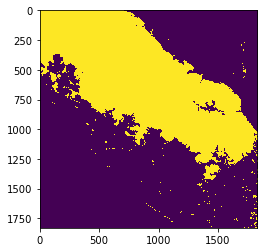

In [76]:
SoilMask = gdal.Open( FilePath+'/Mask/'+'60m.tif')
SoilIndex = SoilMask.GetRasterBand(1).ReadAsArray().astype(np.bool_)
plt.imshow(SoilIndex)
del SoilMask

In [77]:
deglingt_img = np.empty(Bsup.shape, dtype= Bsup.dtype)
index = np.full(Bsup.shape , False, dtype= bool)
buffer = float() 
for f in range(len(FootPrint)):
    if len(NIRSamples[f]) > 0:
        index[:,:] = np.logical_and(FootPrint[f], ~SoilIndex[:,:])
        buffer = Bsup[index] - coeff[f][0]*(Nir9[index[:,:]] - np.nanmin(MinNir))
        print(np.sum(buffer<0))
        buffer[buffer<0] = 0            
        deglingt_img[index] = buffer
deglingt_img[SoilIndex] = Nir9[SoilIndex]

0
21
0
0
0
0
66
24
1136


percentiles  6 ,  94  of band  10 :  150.0 ,  1330.0 



<function matplotlib.pyplot.show>

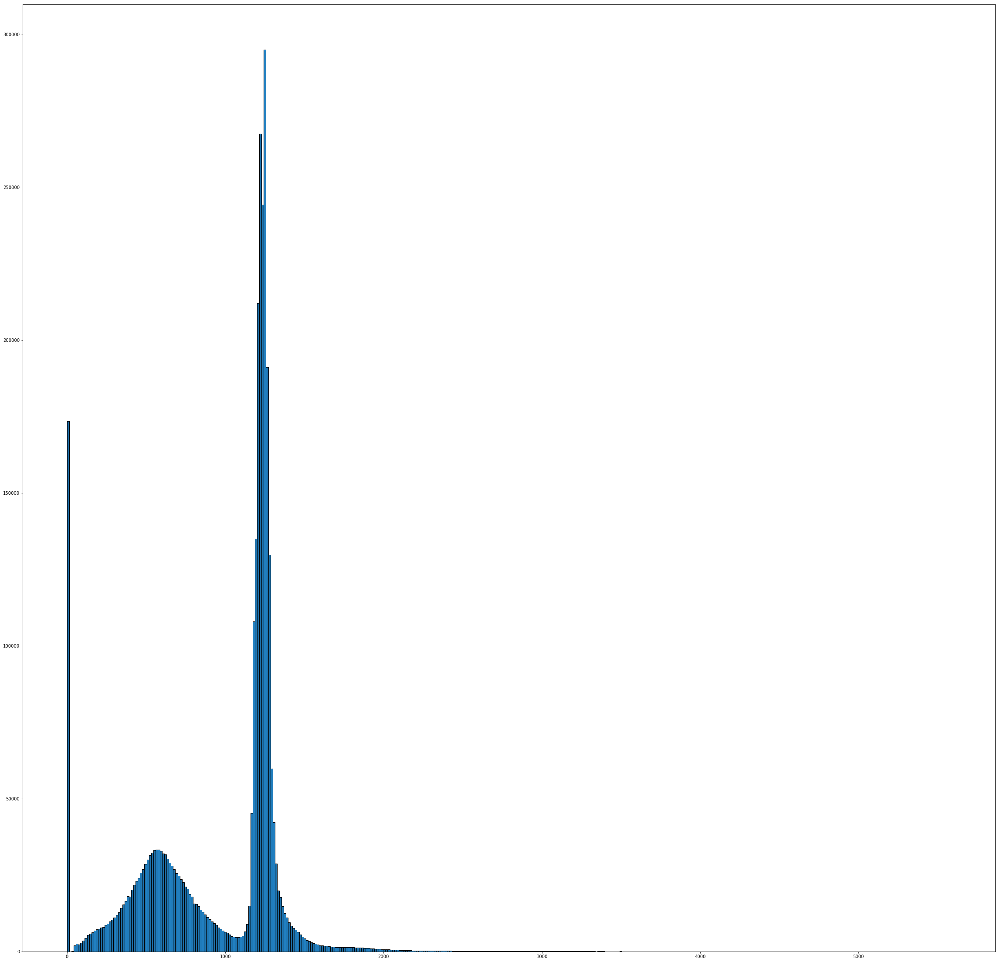

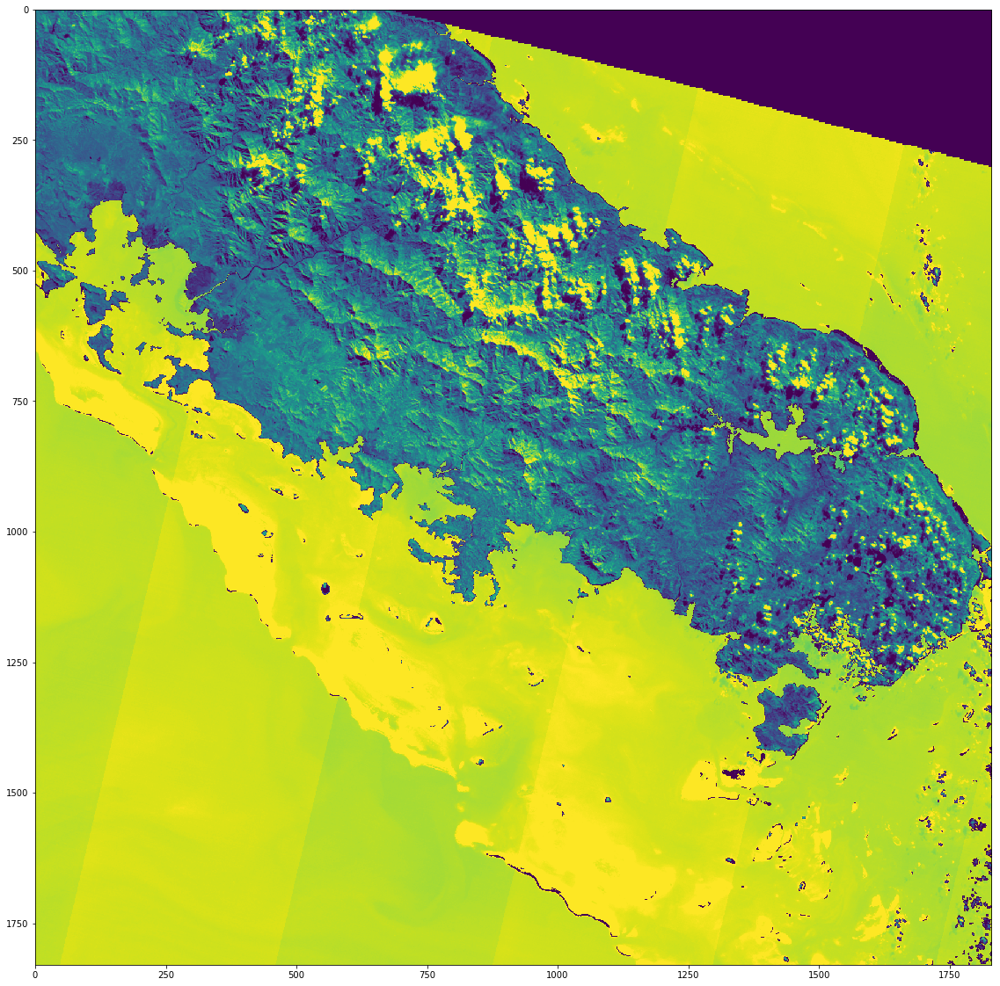

In [79]:
100*np.sum(deglingt_img==0)/len(deglingt_img.flatten())

plt.figure(figsize=(40, 40))
plt.hist(deglingt_img[:,:].ravel(), bins=400, ec='k')
plt.show

better_contrast = np.empty(deglingt_img.shape, dtype= deglingt_img.dtype)
p_min = 6
p_max = 94

v_min, v_max = np.percentile(deglingt_img[:,:], (p_min, p_max))
print('percentiles ',p_min,', ',p_max,' of band ',str(i),': ',str(v_min),', ',str(v_max),'\n')
better_contrast[:,:] = exposure.rescale_intensity(deglingt_img[:,:], in_range=(v_min, v_max))
    
# Degling Image
plt.figure(figsize=(20, 20))
plt.imshow(img_as_float(better_contrast))
plt.axis('on')
plt.show

In [78]:
GT = ds[2].GetGeoTransform()
proj = ds[2].GetProjection()


write_raster2(tilespath+'Deglinted/'+'Blue_Ex.tif', deglingt_img, GT, proj, DriverName="GTiff")

In [ ]:
np.sum(np.isnan(temp.GetRasterBand(1).ReadAsArray()))

In [ ]:
np.sum(np.logical_not(dst.GetRasterBand(1).ReadAsArray()==0))

In [ ]:
print(np.max(ds[1].GetRasterBand(1).ReadAsArray()),np.min(ds[1].GetRasterBand(1).ReadAsArray()))
print(np.max(dst.GetRasterBand(1).ReadAsArray()),np.min(dst.GetRasterBand(1).ReadAsArray()))
print(2**16)

In [ ]:
Mask = None

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(img_as_float(dst.GetRasterBand(1).ReadAsArray()))
plt.axis('on')
plt.show

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn import datasets
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

In [ ]:
labels = spectral_clustering(deglingt_img.ravel(), n_clusters=4, eigen_solver='arpack')
label_im = -np.ones(mask.shape)
label_im[mask] = labels

plt.matshow(deglingt_img)
plt.matshow(label_im)